1. **Initial installation:**

It is used to install the Python library called "pandas-profiling". It is a useful tool for quickly exploring a dataset and obtaining statistical and graphical information about its attributes. It is particularly helpful to understand the composition and data quality before conducting more advanced analyses.

In [1]:
!pip install -U pandas-profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 357.5/357.5 kB 34.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 13.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 52.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 28.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 80.0 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=1bfb9c74755cc9a4fe360bf2c0538e2f32467c0fbd93204564b9172fc1f3b808
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting uninstall: typing-extensions
    Found existing installation: typing_extensions 4.5.0
    Uninstalling typing_extensions-4.5.0:
      Successfully uninstalled typing_

2.  **Libraries import:**

In [2]:
# Standard Library Imports
from pathlib import Path

# Installed packages
import pandas as pd
import matplotlib.pyplot as plt
import io
from sklearn.linear_model import LinearRegression
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Our package
from ydata_profiling import ProfileReport
from ydata_profiling.utils.cache import cache_file

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


3.   **Dataset import**:

In [89]:
# transforming the csv into a pandas data frame

housing = pd.read_csv('/content/drive/MyDrive/Notebooks/TPC_HousingData.csv')

housing.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1,296,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2,242,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2,242,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3,222,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3,222,18.7,396.90,NaN,36.2


4.   **Generate the profiling report:**



In [4]:
# Generate the Profiling Report
profile = ProfileReport(housing, title="Housing Dataset", html={"style": {"full_width": True}}, sort=None)

In [5]:
# Just to get a sense of the data
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

5.  ***Questions:***

Despite the profilling report, some questions were answered with and extra python code, as a didactic/educational strategy and to support the answers.

*   **Question 1:** **What is the shape of the dataset?**

In [90]:
num_observations = housing.shape[0]
num_features = housing.shape[1]
print(f"The dataset has {num_observations} observations (rows) and {num_features} features (columns).")

print("___//___")

#This gives us a whole picture of the dataset, which I think that can also define its shape.
print(housing.info())

The dataset has 506 observations (rows) and 14 features (columns).
___//___
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   CRIM     486 non-null    float64
 1   ZN       486 non-null    float64
 2   INDUS    486 non-null    float64
 3   CHAS     486 non-null    float64
 4   NOX      506 non-null    float64
 5   RM       506 non-null    float64
 6   AGE      486 non-null    float64
 7   DIS      506 non-null    float64
 8   RAD      506 non-null    int64  
 9   TAX      506 non-null    int64  
 10  PTRATIO  506 non-null    float64
 11  B        506 non-null    float64
 12  LSTAT    486 non-null    float64
 13  MEDV     506 non-null    float64
dtypes: float64(12), int64(2)
memory usage: 55.5 KB
None


*   **Question 2: What are the data types of each feature?**

The data types of each feature are:



In [91]:
data_types = housing.dtypes
print(data_types)

CRIM       float64
ZN         float64
INDUS      float64
CHAS       float64
NOX        float64
RM         float64
AGE        float64
DIS        float64
RAD          int64
TAX          int64
PTRATIO    float64
B          float64
LSTAT      float64
MEDV       float64
dtype: object


*  **Question 3: How many observations and features are in the dataset?**




In [92]:
num_rows = len(housing)
print(f"The dataset has {num_rows} rows/observations.")

num_columns = len(housing.columns)
print(f"The dataset has {num_columns} columns/fetaures.")

The dataset has 506 rows/observations.
The dataset has 14 columns/fetaures.


*  **Question 4: Are there any missing or null values in the dataset?**

There are 120 missing cells, which corresponds to 1.7% of the dataset.
To understand the distribution of these missing values, it was analyzed how many are by feature and observation:



In [93]:
missing_values_column = housing.isna().sum()
print(missing_values_column)
print("___//___")

missing_values_row =  housing.isna().any(axis=1).sum()
print(f"Existem {missing_values_row} linhas com pelo menos um valor ausente.")

CRIM       20
ZN         20
INDUS      20
CHAS       20
NOX         0
RM          0
AGE        20
DIS         0
RAD         0
TAX         0
PTRATIO     0
B           0
LSTAT      20
MEDV        0
dtype: int64
___//___
Existem 112 linhas com pelo menos um valor ausente.


*  **Question 5: What is the distribution of the target variable, i.e., the median house value?**

The median house value presents a unimodal curve, i.e. a normal distribution, as seen in Kernel Density Estimation (KDE) and Histogram Plots.
However, it is possible to verify an uncommon behaviour at the right tail of the curve. The boxplot suggests potential outliers of the target variable.

Median: 21.2
Mean: 22.53
Standard Deviation: 9.20


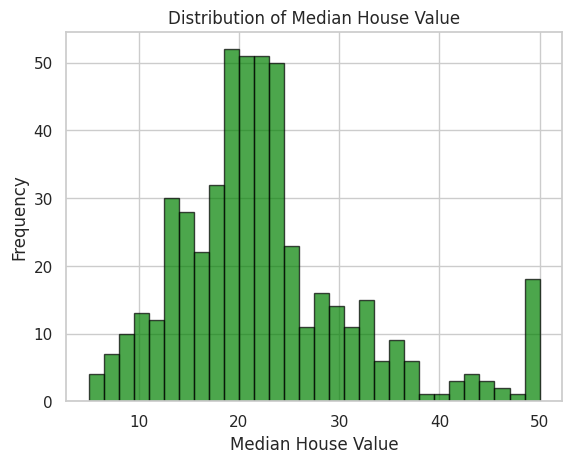

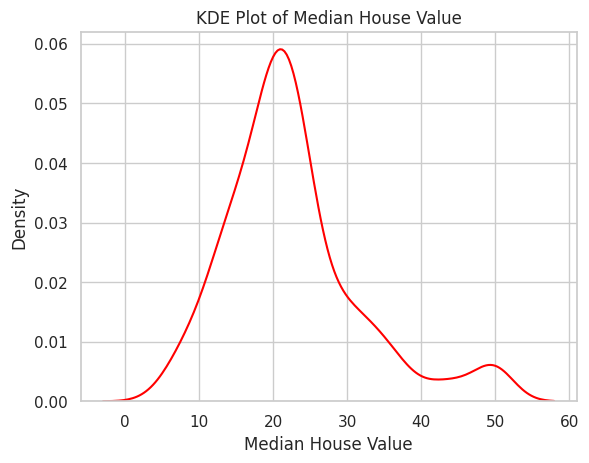

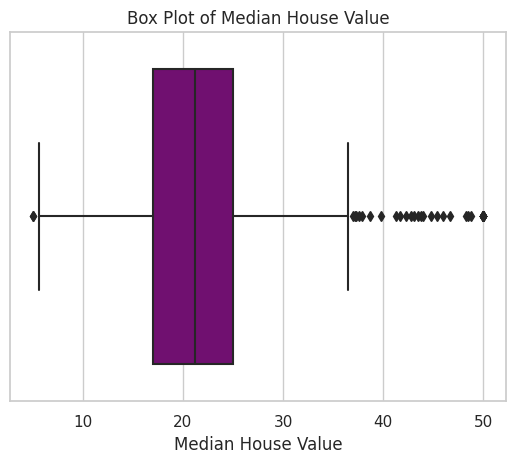

In [94]:
#MEDV - Median value of owner-occupied homes in $1000's
median_value = housing['MEDV'].median()
mean_value = housing['MEDV'].mean()
std_deviation = housing['MEDV'].std()

print(f"Median: {median_value}")
print(f"Mean: {mean_value:.2f}")
print(f"Standard Deviation: {std_deviation:.2f}")

plt.hist(housing['MEDV'], bins=30, color='green', alpha=0.7, edgecolor='black')
plt.xlabel('Median House Value')
plt.ylabel('Frequency')
plt.title('Distribution of Median House Value')
plt.show()

sns.kdeplot(housing['MEDV'], color='red')
plt.xlabel('Median House Value')
plt.ylabel('Density')
plt.title('KDE Plot of Median House Value')
plt.show()

sns.boxplot(x=housing['MEDV'], color='purple')
plt.xlabel('Median House Value')
plt.title('Box Plot of Median House Value')
plt.show()

*   **Question 6: What is the range of values for each feature?**





In [95]:
feature_ranges = housing.agg(['min', 'max'])
print("Range of values for each feature:")
feature_ranges = feature_ranges.transpose()
feature_ranges.columns = ['Mínimo', 'Máximo']
print(feature_ranges)

Range of values for each feature:
            Mínimo    Máximo
CRIM       0.00632   88.9762
ZN         0.00000  100.0000
INDUS      0.46000   27.7400
CHAS       0.00000    1.0000
NOX        0.38500    0.8710
RM         3.56100    8.7800
AGE        2.90000  100.0000
DIS        1.12960   12.1265
RAD        1.00000   24.0000
TAX      187.00000  711.0000
PTRATIO   12.60000   22.0000
B          0.32000  396.9000
LSTAT      1.73000   37.9700
MEDV       5.00000   50.0000


*   **Question 7: How are the different features correlated with each other?**

The heatmap represents the correlation values, making it easier to identify which features are positively or negatively correlated with each other:

     *   A value close to 1 indicates a strong positive correlation:
          *   each variable correlating with itself = 1.00;
          *   TAX vs RAD = 0.91;
     *   A value close to -1 indicates a strong negative correlation:
          *   DIS vs NOX = -0.77;
          *   AGE vs DIS = -0.74;
          *   MEDV vs LSTAT = -0.74;
          *   DIS vs INDUS = -0.71;
     *   A value close to 0 indicates a weak or no correlation:
          *   p.e. RAD vs CHAS = 0.00

This analysis is important, because it allows to have an informed decision upon removing certain features (p.e. excluding missing values and/or redundant features; improving model performance).



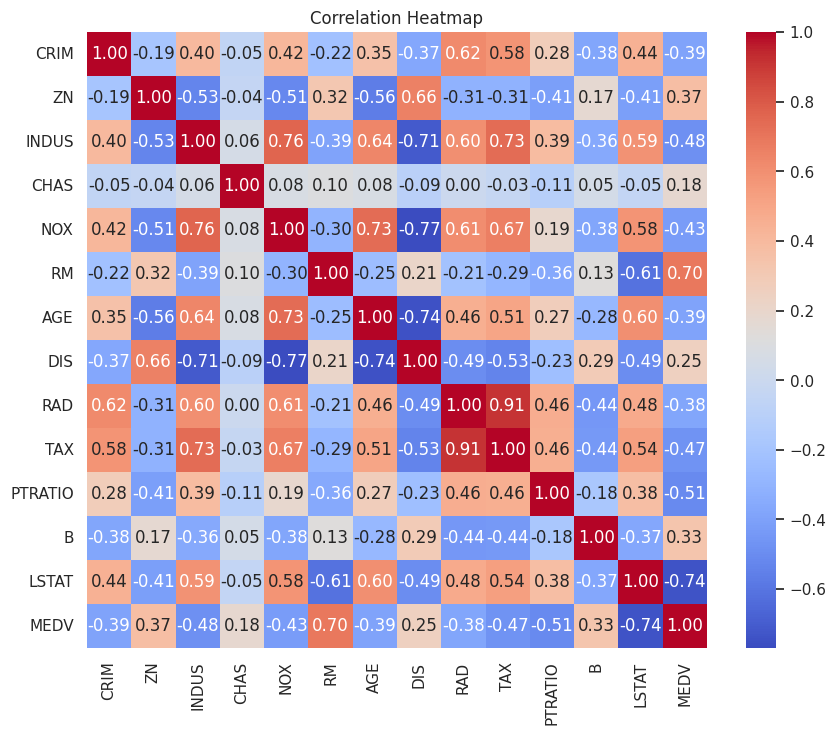

In [96]:
#the corr() method calculates the Pearson correlation coefficient for all pairs of numeric features in the DataFrame.
correlation_matrix = housing.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()

*   **Question 8 : Are there any outliers in the dataset?**

Outliers are data points that deviate significantly from the majority of the data and can have a substantial impact on statistical analyses and machine learning models.
Indeed, on question 5 it was possible to have the evidence of outliers.
Here, it is possible to see on which feature have the higher amount of outliers: CRIM, ZN and B present the higher amount of outliers.



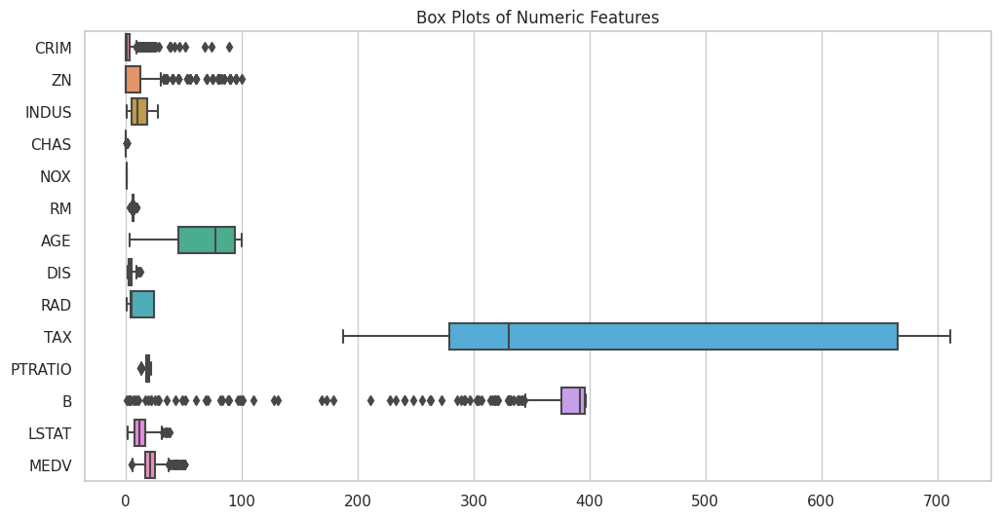

In [97]:
sns.set(style="whitegrid")
plt.figure(figsize=(12, 6))
sns.boxplot(data=housing, orient="h")
plt.title("Box Plots of Numeric Features")
plt.show()

*   **Question 9: What is the frequency distribution of each categorical feature (if any)?**

A categorical feature is a type of data that represents discrete, distinct categories or labels. In fact, there is one categorical feature in this dataset: CHAS - Charles River dummy variable (1 if tract bounds river; 0 otherwise), in which:

    *   0.0 = 452	rows (89.3%);
    *   1.0	= 34 rows	 (6.7%);
    *   Missing Values =	20 rows	(4.0%).


To analyze the frequency distribution of each categorical feature in a dataset, the occurrences of each unique category within each categorical column was count:




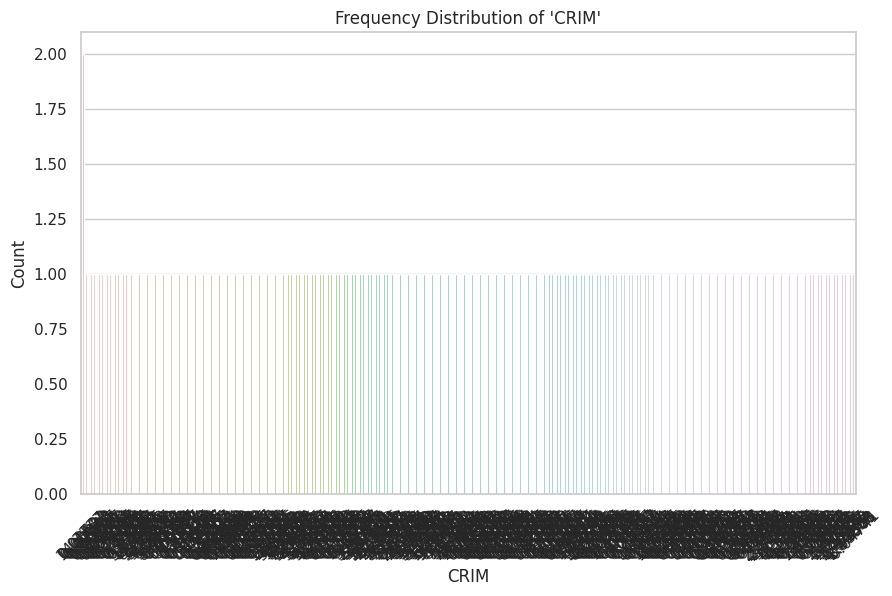

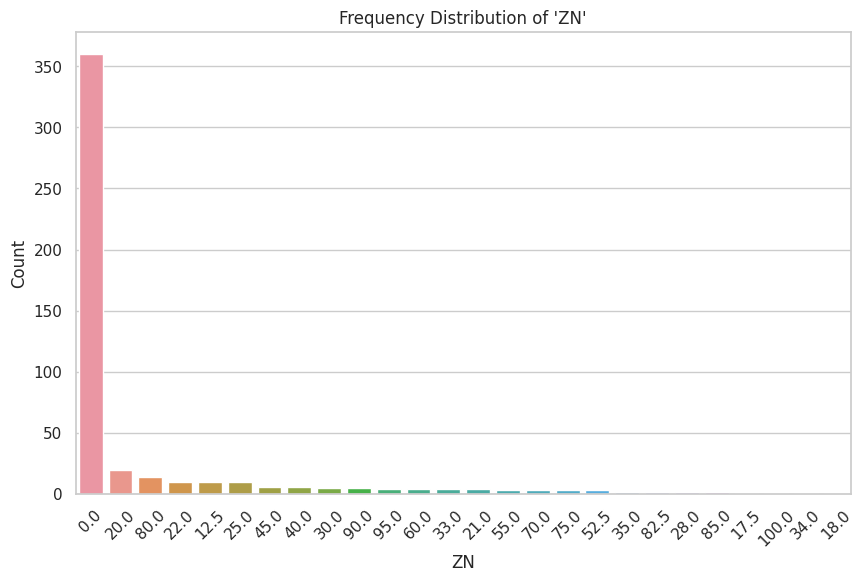

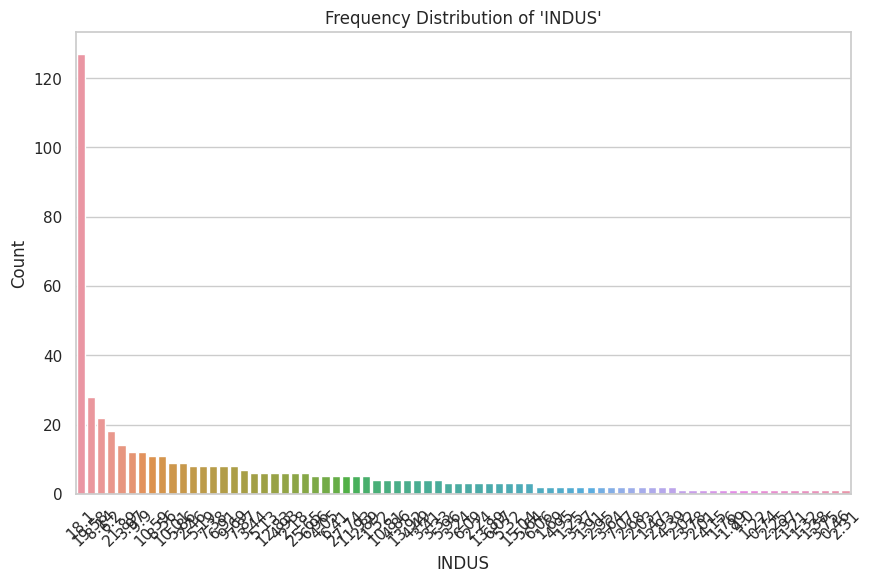

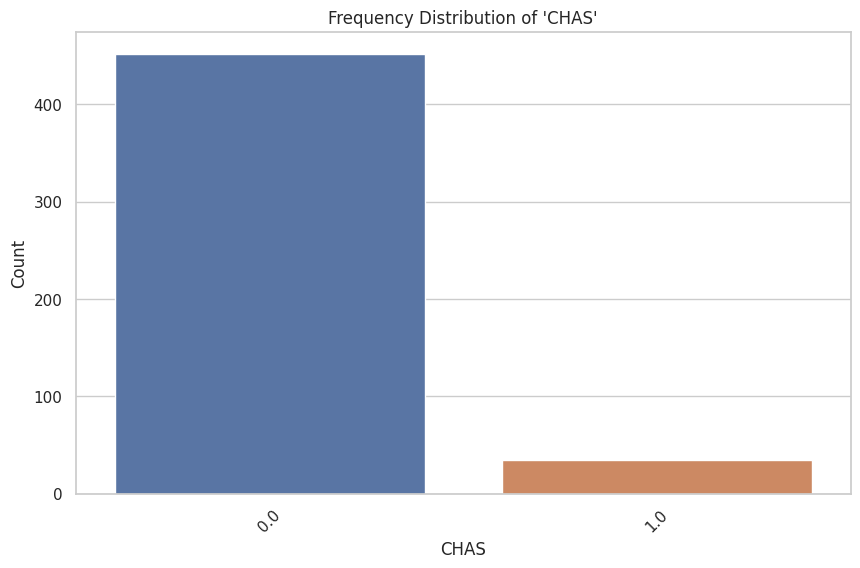

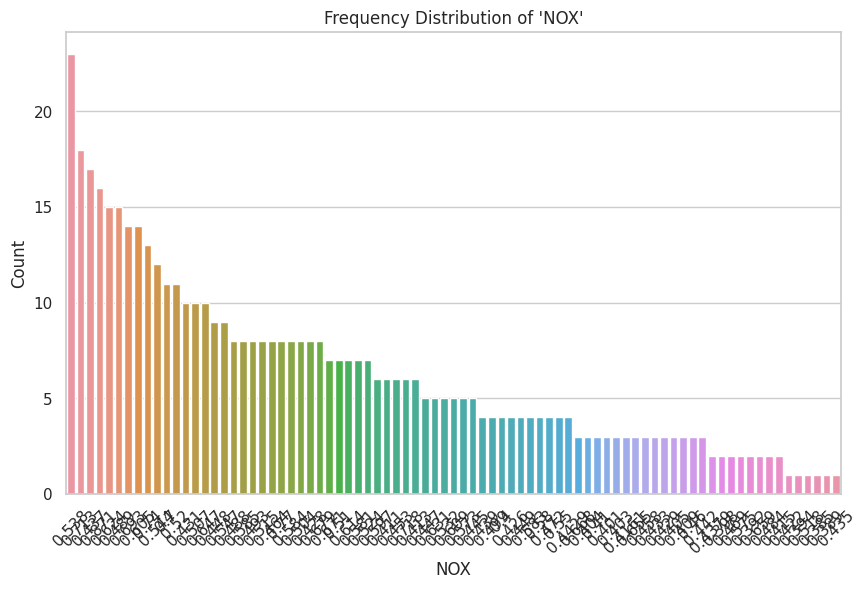

...

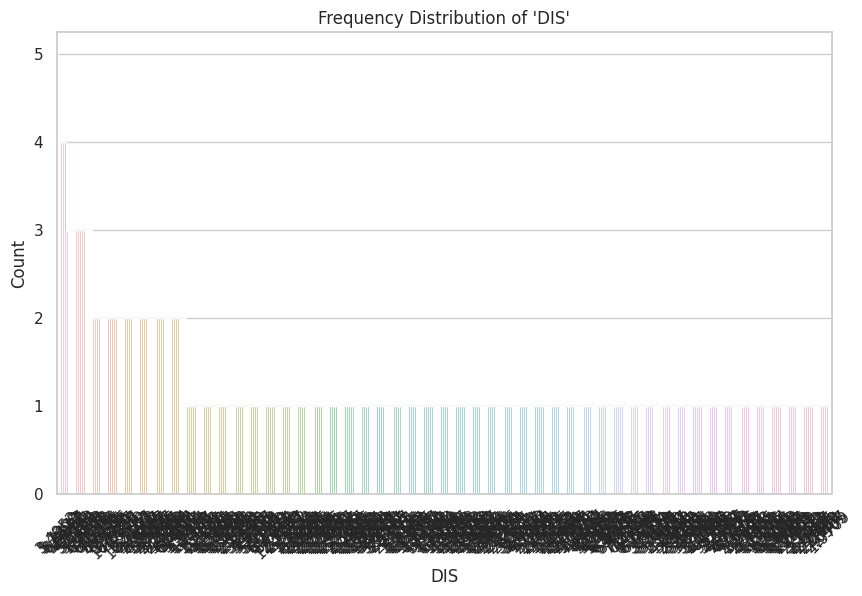

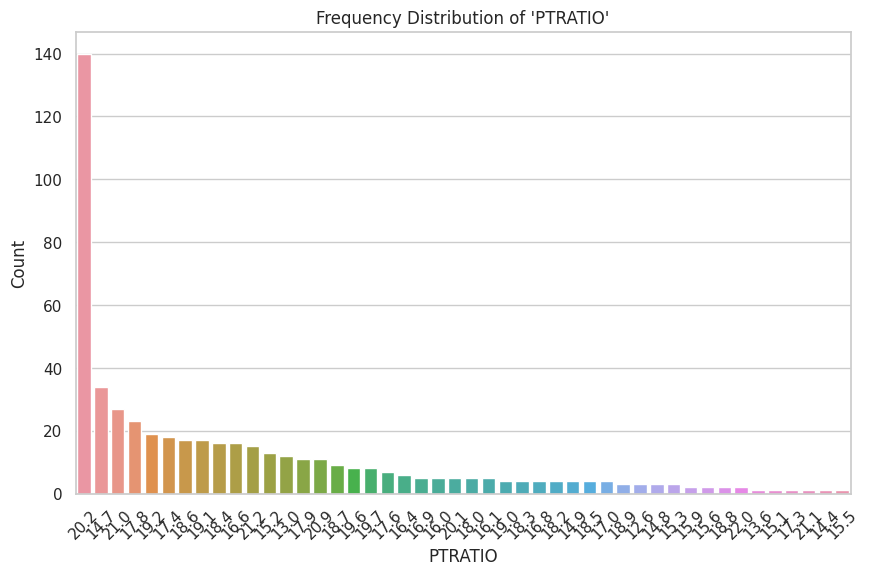

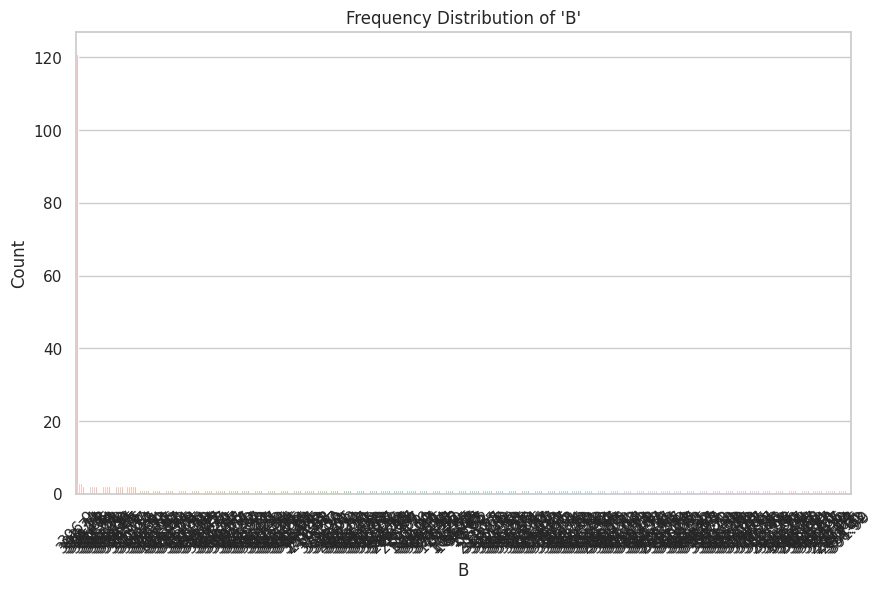

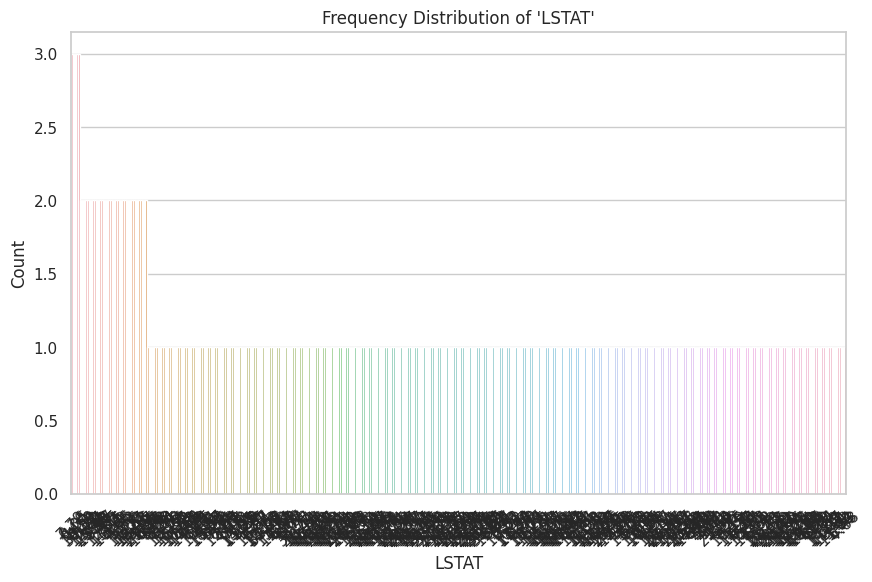

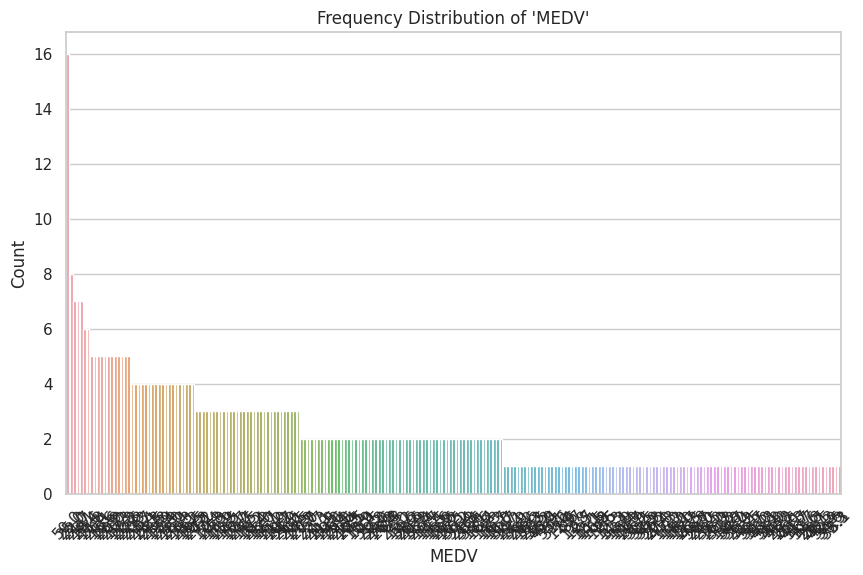

In [98]:
categorical_columns = housing.select_dtypes(include=['float64']).columns

for CHAS in categorical_columns:
    plt.figure(figsize=(10, 6))
    sns.countplot(data=housing, x=CHAS, order=housing[CHAS].value_counts().index)
    plt.xticks(rotation=45)
    plt.title(f"Frequency Distribution of '{CHAS}'")
    plt.xlabel(CHAS)
    plt.ylabel("Count")
    plt.show()

*   **Question 10: Are there any patterns in the relationship between the median house value and the pupil-teacher ratio in the neighborhood?**

Through the relationship between the median house value and the pupil-teacher ratio in the neighborhood, it was possible to verify that tendencionally, the higher the pupil-teacher ratio the lower the median house value, and vice-versa.



Pearson's Correlation Coefficient: -0.51


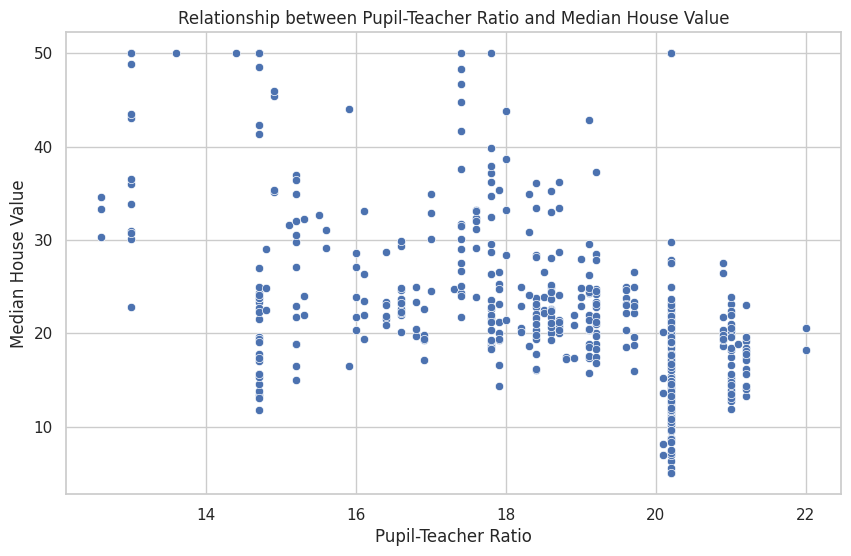

In [99]:
correlation_coefficient = housing['PTRATIO'].corr(housing['MEDV'])
print(f"Pearson's Correlation Coefficient: {correlation_coefficient:.2f}")

plt.figure(figsize=(10, 6))
sns.scatterplot(data=housing, x=housing['PTRATIO'], y=housing['MEDV'])
plt.title("Relationship between Pupil-Teacher Ratio and Median House Value")
plt.xlabel("Pupil-Teacher Ratio")
plt.ylabel("Median House Value")
plt.show()


*   **Question 11: Share any only other insight that you consider relevant.**

According to the heatmap, from question 7, these are the TOP 5 features that are highly correlated:

TAX vs RAD = 0.91;

DIS vs NOX = -0.77;

AGE vs DIS = -0.74;

MEDV vs LSTAT = -0.74;

DIS vs INDUS = -0.71;


However, despite the corrlation between TAX (full-value property-tax rate per $10,000) and RAD (index of accessibility to radial highways), through the graph from question 8, it is possible to observe that TAX has a high standard deviation. So, in this case it was not possible to observe any pattern between these two features.


Taking the DIS (weighted distances to five Boston employment centres) and NOX (nitric oxides concentration - parts per 10 million) correlation, it was possible to observe that higher DIS the lower NOX and vice-versa, meaning, the centres are far away from the source of nitric oxides.


Also, AGE (proportion of owner-occupied units built prior to 1940) correlates with DIS. Higer the proportion of owner-occupied units, lower the distance to the centres, meaning that owner-occupied units built prior to 1940 are mainly occupaied far away from the employment centres. Curiously, the proportion of owner-occupied units is higher in areas with high nitric oxides concentration.


MEDV (Median value of owner-occupied homes in $1000's) vs LSTAT (% lower status of the population): lower the LSTAT, higher the MEDV.


DIS vs INDUS: lower DIS, higher INDUS (proportion of non-retail business acres per town), meaning that the employment centres are located in a non-retail business area.




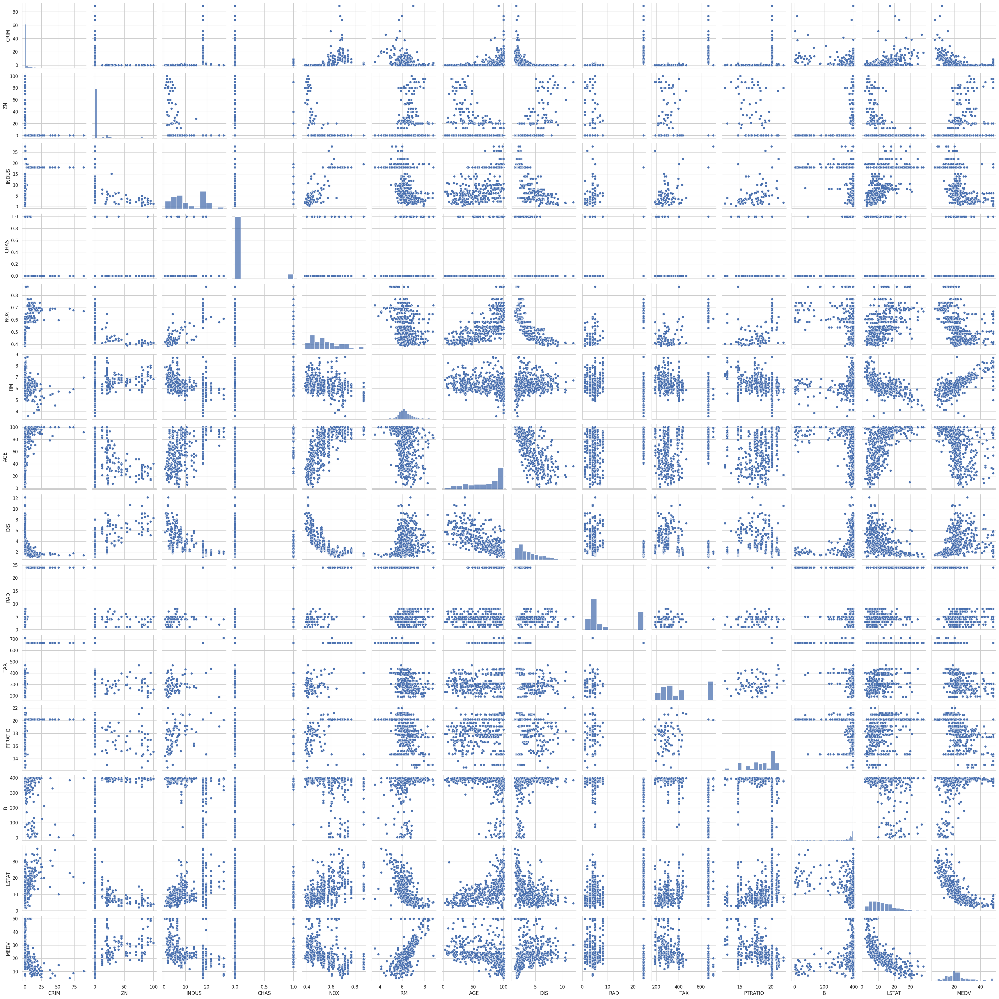

In [100]:
sns.pairplot(housing)
plt.show()

*   **Question 12: Fit a model to predict the median house value?**

*Data Preparation:*

    *   Handle missing data and outliers.
    *   Encode categorical variables if needed.

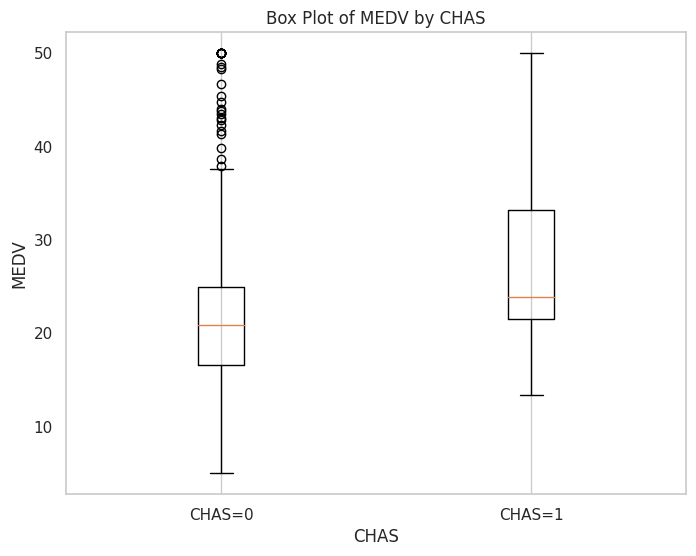

In [82]:
#Delete the feature that less correlates with the target variable (MDEV)
#From the heatmap of question 7, it was possible to observe that the categorical feature (CHAS) was the one that less correlated (0.18) with MEDV
plt.figure(figsize=(8, 6))
plt.boxplot([housing[housing['CHAS'] == 0]['MEDV'], housing[housing['CHAS'] == 1]['MEDV']], labels=['CHAS=0', 'CHAS=1'])
plt.title('Box Plot of MEDV by CHAS')
plt.xlabel('CHAS')
plt.ylabel('MEDV')
plt.grid(axis='y')
plt.show()

In [101]:
housing = housing.drop('CHAS', axis=1)

In [102]:
#Delete features that highly correlate
#According to the heatmap, from question 7, these are the TOP 5 features that are highly correlated:
#TAX vs RAD = 0.91, as mentioned TAX presents a high standard deviation;
#DIS vs NOX = -0.77, the DIS feature correlates with several features, so the NOX will the eliminated;
#AGE vs DIS = -0.74, the DIS feature correlates with several features, so the AGE will the eliminated;;
#MEDV vs LSTAT = -0.74, MEDV is the target variable, and LSTAT correlates with the targeted variable, so will not be eliminated;
#DIS vs INDUS = -0.71, the DIS feature correlates with several features, so the INDUS will the eliminated;;

housing = housing.drop(['INDUS', 'AGE','TAX', 'NOX'], axis=1)

In [103]:
#Delete the features that present the higher amount of outliers
#According to the analysis made on question 8, the features are: CRIM, ZN and B.
housing = housing.drop(['CRIM', 'ZN','B'], axis=1)

*Feature Selection and Engineering:*

    *   Select relevant features that are likely to impact the median house value.
    *   Create new features if necessary.

In [104]:
#Think about the features with missing values: the only one that was not deleted on previous analyses is LSTAT, so further treatment will be necessary. Besisdes, LSTAT highly correlates with MEDV.

# Extract the rows with missing LSTAT values
missing_lstat_rows = housing[housing['LSTAT'].isnull()]

# Extract the rows without missing LSTAT values
non_missing_lstat_rows = housing[~housing['LSTAT'].isnull()]

# Create a linear regression model
model = LinearRegression()

# Fit the model using MEDV to predict LSTAT
model.fit(non_missing_lstat_rows[['MEDV']], non_missing_lstat_rows['LSTAT'])

# Predict missing LSTAT values using the model
predicted_lstat = model.predict(missing_lstat_rows[['MEDV']])

# Fill in the missing LSTAT values with the predicted values
housing.loc[missing_lstat_rows.index, 'LSTAT'] = predicted_lstat

missing_values = housing.isnull().sum()

if missing_values.sum() == 0:
    print("There are no missing values in the dataset.")
else:
    print("Missing values in each column:")
    print(missing_values)

housing.head()


There are no missing values in the dataset.


,RM,DIS,RAD,PTRATIO,LSTAT,MEDV
0,6.575,4.0900,1,15.3,4.980000,24.0
1,6.421,4.9671,2,17.8,9.140000,21.6
2,7.185,4.9671,2,17.8,4.030000,34.7
3,6.998,6.0622,3,18.7,2.940000,33.4
4,7.147,6.0622,3,18.7,4.853127,36.2


*Train-Test Split:*

    *   Split your data into a training set and a testing set. This is typically done to evaluate the model's performance.

*Choose a Regression Algorithm:*

    *   Select a regression algorithm suitable for your problem. Common choices include Linear Regression, Decision Trees, Random Forests, Support Vector Regression, etc.

*Model Training:*

    *   Train the regression model using the training data.

*Model Evaluation:*

    *   Evaluate the model's performance on the testing set using appropriate evaluation metrics like Mean Squared Error (MSE), Root Mean Squared Error (RMSE), or R-squared (R²).

*Hyperparameter Tuning:*

    *   Fine-tune the model by adjusting hyperparameters to improve its performance.

*Model Interpretation:*

    *   Understand which features have the most significant impact on the targeted variable by analyzing coefficients (in the case of linear regression) or feature importance (in the case of tree-based models).

*Deployment:*

    *   If the model performs satisfactorily, you can deploy it to make predictions on new data.

In [108]:
#Prediction using a liner regression

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error


# Separate features and target variable
X = housing.drop(columns=['MEDV'])
y = housing['MEDV']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and fit a Linear Regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions on the test data
y_pred = model.predict(X_test)

# Evaluate the model using Mean Squared Error
mse = mean_squared_error(y_test, y_pred)
print(f"Mean Squared Error: {mse:.2f}")

# Calculate the R-squared (R2) score
r2 = r2_score(y_test, y_pred)
print(f"R-squared (R2) Score: {r2:.2f}")

# You can also access the model's coefficients and intercept
print("Coefficients:", model.coef_.round(2))
print("Intercept:", round(model.intercept_, 2))

Mean Squared Error: 27.46
R-squared (R2) Score: 0.63
Coefficients: [ 4.73 -0.64 -0.07 -0.8  -0.65]
Intercept: 18.85


In [111]:
#Prediction using a Random Forest

# Split the dataset into features and target
X = housing[['RM',	'DIS',	'RAD',	'PTRATIO',	'LSTAT']]
y = housing['MEDV']

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and train the Random Forest regressor
rf_regressor = RandomForestRegressor(n_estimators=100, random_state=42)
rf_regressor.fit(X_train, y_train)

# Make predictions
y_pred = rf_regressor.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Display the results
print(f"Mean Squared Error: {mse:.2f}")
print(f"R-squared (R2) Score: {r2:.2f}")

Mean Squared Error: 11.86
R-squared (R2) Score: 0.84


The Random Forest revealed to be the best method, with a lower mean squared error and with a better R-squared. In fact, Random Forest is an extension of decision trees and generally provides robust performance and better generalization.